<a href="https://colab.research.google.com/github/maderaroja/Predicting-Anomoloy-Logs/blob/main/Final_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
#!pip install altair_data_server

In [5]:
# Import Necessary libraries
import altair as alt
import datetime
from IPython.display import HTML
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import re
import string
from sklearn import tree
from sklearn.dummy import DummyClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.neighbors import KNeighborsClassifier
from sklearn.impute import KNNImputer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.preprocessing import (
    FunctionTransformer,
    Normalizer,
    OneHotEncoder,
    OrdinalEncoder,
    StandardScaler,
    normalize,
    scale,
    )
from sklearn.metrics import plot_confusion_matrix, classification_report
from sklearn.svm import SVC, SVR
# import graphviz

# Save a vega-lite spec and a PNG blob for each plot in the notebook
alt.renderers.enable('mimetype')
alt.renderers.enable('default')
# Handle large data sets without embedding them in the notebook
alt.data_transformers.enable('data_server')
#alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('data_server')

In [6]:
# Read in hadoop_df
hadoop = pd.read_csv('hadoop_df.csv') #, parse_dates=True

# drop Unnamed: 0 column
hadoop.drop(["Unnamed: 0", "BlockId", "month", "day", "component", "content"], axis=1, inplace=True)
hadoop.head()

,Label,block,date,time,pid,level,year
0,Normal,1608999687919862906,2009-08-11,203518,143,INFO,2009.0
1,Normal,1608999687919862906,2009-08-11,203518,35,INFO,2009.0
2,Normal,1608999687919862906,2009-08-11,203519,143,INFO,2009.0
3,Normal,1608999687919862906,2009-08-11,203519,145,INFO,2009.0
4,Normal,1608999687919862906,2009-08-11,203519,145,INFO,2009.0


In [7]:
# Use .info to get information on hadoop

hadoop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82255 entries, 0 to 82254
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Label   82255 non-null  object 
 1   block   82255 non-null  int64  
 2   date    82255 non-null  object 
 3   time    82255 non-null  int64  
 4   pid     82255 non-null  int64  
 5   level   82255 non-null  object 
 6   year    82254 non-null  float64
dtypes: float64(1), int64(3), object(3)
memory usage: 4.4+ MB


To adhere to the Golden Rule, let's now split our dataset before anything else.

In [8]:
# Split hadoop into training and test sets.
train_df, test_df = train_test_split(hadoop, test_size=0.2, random_state=77)
train_df.head()

,Label,block,date,time,pid,level,year
53520,Normal,26971670885768519,2009-08-11,203904,32,INFO,2009.0
68844,Normal,3689862003003839648,2009-08-11,203940,28,INFO,2009.0
20414,Normal,8916560322184963168,2009-08-11,220401,13,INFO,2009.0
5434,Normal,8054782785917830420,2009-08-11,214822,2785,WARN,2009.0
5802,Normal,859705208416062320,2009-08-11,203603,30,INFO,2009.0


In [9]:
# Use .describe() and .info() to find out more info.
train_df.info()
train_df.describe()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65804 entries, 53520 to 47831
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Label   65804 non-null  object 
 1   block   65804 non-null  int64  
 2   date    65804 non-null  object 
 3   time    65804 non-null  int64  
 4   pid     65804 non-null  int64  
 5   level   65804 non-null  object 
 6   year    65803 non-null  float64
dtypes: float64(1), int64(3), object(3)
memory usage: 4.0+ MB


,block,time,pid,year
count,6.580400e+04,65804.000000,65804.000000,65803.000000
mean,4.641602e+18,180120.473786,575.281989,2009.245931
std,2.642594e+18,50429.167826,1007.552737,0.430641
min,2.996564e+15,1.000000,13.000000,2009.000000
25%,2.398210e+18,203531.000000,27.000000,2009.000000
50%,4.616943e+18,203828.000000,153.000000,2009.000000
75%,6.949404e+18,204950.250000,301.000000,2009.000000
max,9.218678e+18,235954.000000,3103.000000,2010.000000


Find the distribution of our target values in **`Label`**.

In [10]:
#Find the distribution of our target values in level
class_dist = train_df.value_counts('Label')
class_dist

Label
Normal     64078
Anomaly     1726
dtype: int64

Before preprocessing let's separate the feature vectors from the target feature, **`Label`**.

In [11]:
# Separate feature vectors from the target, Label.
X_train = train_df.drop(columns=["Label"])
y_train= train_df["Label"]

X_test = test_df.drop(columns=["Label"])
y_test = test_df["Label"]
X_train.head()

,block,date,time,pid,level,year
53520,26971670885768519,2009-08-11,203904,32,INFO,2009.0
68844,3689862003003839648,2009-08-11,203940,28,INFO,2009.0
20414,8916560322184963168,2009-08-11,220401,13,INFO,2009.0
5434,8054782785917830420,2009-08-11,214822,2785,WARN,2009.0
5802,859705208416062320,2009-08-11,203603,30,INFO,2009.0


To further understand our training data set, let's take a look at how some of the features interact with the target.

In [12]:
#Visualize the relationship among block, pid, & level.
#Let's focus on the columns we want to plot
columns_to_plot = train_df[["block", "pid", "level"]]
columns_to_plot

# Using groubby, mean, and resetindex(), plot columns "block", "pid", "level".
plot_df1 = columns_to_plot.groupby(by="pid").count()
plot_df1 = columns_to_plot.reset_index()
plot_df1

# Use moist_type to plot.
plot1 = alt.Chart(plot_df1, width = 300, height=500).mark_bar().encode(
alt.X('pid'),
alt.Y('block'),
alt.Color("level"))

plot1

alt.Chart(...)

In [14]:
#Visualize the relationship among block, pid, & level.
#Let's focus on the columns we want to plot
columns_to_plot = train_df[["year", "pid", "level"]]
columns_to_plot

# Using groubby, mean, and resetindex(), plot columns "year", "pid", "level".
plot_df2 = columns_to_plot.groupby(by="year").count()
plot_df2 = columns_to_plot.reset_index()
plot_df2

# Use moist_type to plot.
plot2 = alt.Chart(plot_df2, width = 300, height=500).mark_bar().encode(
alt.X('year'),
alt.Y('pid'),
alt.Color("level"))

plot2

alt.Chart(...)

# Build Base Model with which to Compare Models

In [15]:
# Save our base model as dummy.
dummy = DummyClassifier(strategy='most_frequent')

# Use dummy to fit on the training set.
dummy.fit(X_train, y_train)

# Cross validate and save the results as a dataframe in the object dummy_scores. Be sure to return the train score.
dummy_scores = pd.DataFrame(cross_validate(dummy, X_train, y_train, cv=5, return_train_score=True))
dummy_scores

,fit_time,score_time,test_score,train_score
0,0.037651,0.028269,0.973786,0.973767
1,0.039370,0.028632,0.973786,0.973767
2,0.035837,0.029904,0.973786,0.973767
3,0.036243,0.028841,0.973710,0.973786
4,0.035870,0.027950,0.973784,0.973767


Find the mean of the results in dummy_scores.

In [16]:
# Find the mean of each column in dummy_scores, and save object as dummy_mean.
dummy_mean = dummy_scores.mean()
dummy_mean

fit_time       0.036994
score_time     0.028719
test_score     0.973771
train_score    0.973771
dtype: float64

# Preprocessing the Data and Pipeline Building  
  
In order to preprocess, first separate the features into their types (binary, ordinal etc.).

In [17]:
X_train.dtypes

block      int64
date      object
time       int64
pid        int64
level     object
year     float64
dtype: object

In [18]:
# Separate columns into feature types.
numeric_features = ["block", "time", "pid", "year"]
categorical_features = ["date"]
binary_features = ["level"]
target = ["Label"]

In [19]:
# Make a pipeline for each of the four feature types.
numeric_transformer = make_pipeline(
    SimpleImputer(strategy='median'),
    StandardScaler()
)
catergorical_transformer = make_pipeline(
    KNNImputer(n_neighbors=2)
)

# Make a preprocessor with these piplines.
preprocessor = make_column_transformer(
                                      (numeric_transformer, numeric_features)
                                      #(catergorical_transformer, categorical_features)
                                      )

# Build Models with which to Compare Base Model

In [20]:
# Use RandomForestClassifier to build a pipe, rfc_pipe.
rfc_pipe = make_pipeline(preprocessor, RandomForestClassifier(class_weight ="balanced", random_state=77, n_estimators=10))
#rfc_pipe

In [21]:
# Fit rfc_pipe on the training set.
rfc_pipe.fit(X_train, y_train)

# Cross validate on the training using rfc_pipe. Save the results in a DataFrame.
rfc_scores =pd.DataFrame(cross_validate(rfc_pipe, X_train, y_train, cv=5, return_train_score=True))
rfc_scores

,fit_time,score_time,test_score,train_score
0,0.803225,0.056542,0.990350,0.999430
1,0.832269,0.057933,0.989135,0.999278
2,0.788882,0.054822,0.988907,0.999297
3,0.822543,0.053885,0.988755,0.999335
4,0.803076,0.053754,0.989514,0.999582


Find the mean of rfc_scores.

In [22]:
rfc_mean_scores = rfc_scores.mean()
rfc_mean_scores

fit_time       0.809999
score_time     0.055387
test_score     0.989332
train_score    0.999385
dtype: float64

Let's tune the hyperparameters n_estimators and max_depth. For speed, **RandomizedSearchCV** is used below and not **GridSearchCV**.

In [23]:
import scipy
from scipy.stats import randint

rf_pipeline = make_pipeline(
    preprocessor, RandomForestClassifier(random_state=123)
)

param_dist = {
    "randomforestclassifier__n_estimators": scipy.stats.randint(low=10, high=300),
    "randomforestclassifier__max_depth": scipy.stats.randint(low=2, high=20),
}

random_search = RandomizedSearchCV(
    rf_pipeline,
    param_dist,
    n_iter=50,
    cv=3,
    verbose=1,
    n_jobs=-1,
    scoring="accuracy",
    random_state=123,
)
random_search.fit(X_train, y_train)

Fitting 3 folds for each of 50 candidates, totalling 150 fits


RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('columntransformer',
                                              ColumnTransformer(transformers=[('pipeline',
                                                                               Pipeline(steps=[('simpleimputer',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('standardscaler',
                                                                                                StandardScaler())]),
                                                                               ['block',
                                                                                'time',
                                                                                'pid',
                                                                              

In [24]:
# Calculate the best hyperparameter value for n_estimator and max_depth, and save as optimal_parameters.
optimal_parameters = random_search.best_params_

# Calculate the corresponding validation score, and save as optimal_score.
optimal_score = random_search.best_score_

optimal_parameters, optimal_score

({'randomforestclassifier__max_depth': 19,
  'randomforestclassifier__n_estimators': 278},
 0.9868701073899527)

In [30]:
pd.DataFrame(random_search.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_randomforestclassifier__max_depth,param_randomforestclassifier__n_estimators,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,8.692817,0.095211,0.560334,0.006068,15,108,"{'randomforestclassifier__max_depth': 15, 'ran...",0.983953,0.982767,0.984271,0.983664,0.000647,16
1,1.683551,0.007212,0.188412,0.012395,8,27,"{'randomforestclassifier__max_depth': 8, 'rand...",0.977844,0.977935,0.978253,0.978010,0.000175,32
2,9.798371,0.028124,0.592114,0.011787,12,133,"{'randomforestclassifier__max_depth': 12, 'ran...",0.980898,0.980397,0.981171,0.980822,0.000321,25
3,3.163978,0.036655,0.310366,0.009019,3,106,"{'randomforestclassifier__max_depth': 3, 'rand...",0.973786,0.973741,0.973785,0.973771,0.000021,48
4,11.649551,0.267692,0.679421,0.004408,19,136,"{'randomforestclassifier__max_depth': 19, 'ran...",0.987281,0.985548,0.987189,0.986673,0.000796,2
5,6.901456,0.146523,0.437724,0.001752,17,83,"{'randomforestclassifier__max_depth': 17, 'ran...",0.986688,0.984728,0.985912,0.985776,0.000806,10
6,5.321096,0.083419,0.526968,0.009994,2,234,"{'randomforestclassifier__max_depth': 2, 'rand...",0.973786,0.973741,0.973785,0.973771,0.000021,48
7,21.454552,0.295725,1.214439,0.052994,17,263,"{'randomforestclassifier__max_depth': 17, 'ran...",0.986642,0.984910,0.986186,0.985913,0.000733,8
8,5.016783,0.115169,0.371685,0.022997,6,106,"{'randomforestclassifier__max_depth': 6, 'rand...",0.976932,0.977251,0.977022,0.977068,0.000134,42
9,6.506390,0.217492,0.441832,0.008554,18,78,"{'randomforestclassifier__max_depth': 18, 'ran...",0.986870,0.985731,0.986870,0.986490,0.000537,3


Score the model on the test set.

In [31]:
# Evaluate the best model from random_seach on the full training set.
training_score = random_search.score(X_train, y_train)
training_score

0.9987538751443681

In [32]:
# Evaluate the best model from random_seach on the full test set.
test_score = random_search.score(X_test, y_test)
test_score

0.9875387514436812

Observed error: the first sign of an error that may have to deal with the missing categorical features appears here and continue below.

    Significance of Error: the calculated scores could be slightly or extremely skewed.



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


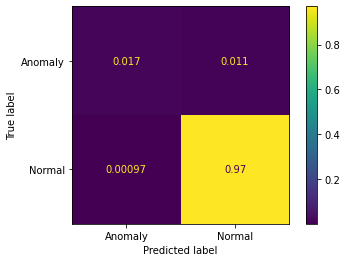

In [33]:
# Plot a confusion matrix on the test set using random_search 
cm_plot = plot_confusion_matrix(random_search, X_test, y_test, normalize="all")
cm_plot

In [34]:
# Print a classification report on X_test of random_search's best model.
print(classification_report(y_test, random_search.predict(X_test)))

              precision    recall  f1-score   support

     Anomaly       0.95      0.60      0.74       474
      Normal       0.99      1.00      0.99     15977

    accuracy                           0.99     16451
   macro avg       0.97      0.80      0.86     16451
weighted avg       0.99      0.99      0.99     16451

